In [1]:
import numpy as np 
import cv2
import os
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import clear_output
import time
import pandas
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import MiniBatchKMeans, KMeans

## Loading in Query images

In [2]:
query_images_path = []
query_names = []

images_path = r"C:\Users\Sean\Desktop\Image-Retrieval\Oxford code\Oxford dataset\Oxford building images"
gt_path = r"C:\Users\Sean\Desktop\Image-Retrieval\Oxford code\Ground Truth files"

for filename in sorted(os.listdir(gt_path)):
    if filename.endswith("query.txt"):
        
        # Saving filename
        tmp = filename.split(".")[0].split("_")
        if len(tmp) == 4:
            name = tmp[0]+"_"+tmp[1]
        elif len(tmp) == 3:
            name = tmp[0]
        query_names.append(name)
        
        # Reading the image number to be saved
        with open(os.path.join(gt_path, filename), "r") as f:
            line = f.readline()
            query_images_path.append(line.split(" ")[0])

query_gray_images = []
query_colour_images = []

for queries in query_images_path:
    image = cv2.imread(os.path.join(images_path, queries[5:]) + ".jpg")
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    query_gray_images.append(gray_image)
    query_colour_images.append(image)

In [3]:
print(len(query_gray_images))

55


## Loading in dataset (good and ok)

In [4]:
images_path = r"C:\Users\Sean\Desktop\Image-Retrieval\Oxford code\Oxford dataset\Oxford building images"
gt_path = r"C:\Users\Sean\Desktop\Image-Retrieval\Oxford code\Ground Truth files"

good_ok_data_names = []
good_ok_data_images_path = []
good_ok_data_gray_images = []
good_ok_data_colour_images = []

all_image_names = []

for filename in sorted(os.listdir(gt_path)):
    if filename.endswith("good.txt") or filename.endswith("ok.txt"):
        
        # Saving filenames
        tmp = filename.split(".")[0].split("_")
        if len(tmp) == 4:
            name = tmp[0]+"_"+tmp[1]
        elif len(tmp) == 3:
            name = tmp[0]
        
        # Saving image paths
        with open(os.path.join(gt_path, filename), "r") as f:
            line = f.readlines()
            for i in range(len(line)):
                line[i] = line[i][:-1]
                # Check if image has already been added:
                if line[i] not in all_image_names:
                    # Append this many names
                    good_ok_data_names.append(name)
                    good_ok_data_images_path.append(line[i])
                    all_image_names.append(line[i])

for data in good_ok_data_images_path:
    image = cv2.imread(os.path.join(images_path, data) + ".jpg")
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    good_ok_data_gray_images.append(gray_image)
    good_ok_data_colour_images.append(image)

In [5]:
print(len(good_ok_data_gray_images))

567


## Solving pixel values for queries and data

In [6]:
query_pixels = []
for image in query_gray_images:
    img = Image.fromarray(image)
    img = img.resize((100,100))
    img = np.array(img)
    img = img.reshape((10000,))
    query_pixels.append(img)

good_ok_data_pixels = []
for image in good_ok_data_gray_images:
    img = Image.fromarray(image)
    img = img.resize((100,100))
    img = np.array(img)
    img = img.reshape((10000,))
    good_ok_data_pixels.append(img)

## Computing metrics for ground truth files

In [6]:
def image_retrieval_k(train_data, test_data, train_names, test_names, train_images_as_array, test_images_as_array, k=20, view_option=0, image_size=(32,32)):
    avg_precisions = []
    avg_recalls = []
    precisionsatk = []
    count = 0
    
    for idx, query in enumerate(test_data):
        
        all_precisions = []
        all_recalls = []
        precisions = []
        recalls = []

        # Finding the euclidean distance from the query image and sorting them into index
        query = query.reshape((1, -1))
        D = euclidean_distances(train_data, query).squeeze()
        index = np.argsort(D)
        
        # Finding the index of the last correct image in the sorted index to iter to
        last_correct_image_idx = 0
        for i in range(len(index)):
            if train_names[index[i]] == test_names[idx]:
                last_correct_image_idx = i
        
        # make sure we iter to k (for precision@k) if all correct images are found before k
        if k > last_correct_image_idx:
            last_correct_image_idx = k+1
        
        # Itering through all images untill we get to k or last correct image to compute AP
        for kk in range(1, last_correct_image_idx+2):
            TP = 0
            FP = 0
            FN = 0
            
            # Finding the correct amount of images in the training set
            correct_count = 0
            for ind in index:
                if train_names[ind] == test_names[idx]:
                    correct_count += 1
            sized_index = index[:kk]
            
            # Find TP FP FN
            for ind in sized_index:
                if train_names[ind] == test_names[idx]:
                    TP += 1
                else:
                    FP += 1
            FN = correct_count - TP
            
            # If we want to view the images then we run this code, else its a waste of computational time
            if view_option == 1:
                # Creating image of k images (including query image at start)
                tmp = [query.reshape(image_size)]
                for ind in sized_index[:k]:
                    tmp.append(train_data[ind].reshape(image_size))
                output = np.array(tmp)*255
                output = output.transpose(1, 0, 2)
                output = output.reshape((image_size[0], -1))
                im_query = Image.fromarray(output)
            
            # If the last k image is a correct image we add precision to the list
            if train_names[sized_index[-1]] == test_names[idx]:
                precisions.append(TP/(TP+FP))
                recalls.append(TP/(TP+FN))

            # Adding all precisions and recalls to a seperate list
            all_precisions.append(TP/(TP+FP))
            all_recalls.append(TP/(TP+FN))
        
     
        # Solving AP, AR and precision@k
        avg_precisions.append(np.average(precisions))
        avg_recalls.append(np.average(all_recalls))
        precisionsatk.append(all_precisions[k-1])
        
        # Set a viewing option, if 1 we print out the following:
        if view_option == 1:
            display(im_query) 
            print("Label: {}".format(test_names[idx]))
            print("Average Precision for query {}: ".format(idx), avg_precisions[-1])
            print("Precision@k for query {}: ".format(idx), precisionsatk[-1])
            print("\n")
        elif view_option == 0:
            count += 1 
            clear_output(wait=True)
            print("Percentage Complete: {}".format((count/len(test_data))*100))
        elif view_option == 2:
            # Allowing a view_option 2 -> for viewing top k images from non_pixel value inputs
            # creating an array of the top k similar images
            top_k_images = [test_images_as_array[idx]]
            for i in range(0,k):
                top_k_images.append(train_images_as_array[index[i]])

            fig, axes = plt.subplots(1, k+1, figsize=(200/k, 200/k))
            for i, (image, ax) in enumerate(zip(top_k_images, axes.ravel())):
                ax.imshow(image)
                if i == 0:
                    ax.set_title("Query: {}".format(test_names[idx]))
                else:
                    ax.set_title(train_names[sized_index[i-1]])
                ax.axis("off")
            plt.show()
            print("Label: {}".format(test_names[idx]))
            print("Average Precision for query {}: ".format(idx), avg_precisions[-1])
            print("Precision@k for query {}: ".format(idx), precisionsatk[-1])
            print("\n")
        
    return avg_precisions, avg_recalls, precisionsatk

In [7]:
def save_data_to_csv(_precisionsatk, _AP, _k, _dataset_name):
    data = {'Precision@k': _precisionsatk, 'Average Precision': _AP}
    df = pandas.DataFrame(data=data)
    pandas.set_option("display.max_rows", 500, "display.max_columns", 4)
    df.to_csv('{}-metrics_k={}.csv'.format(_dataset_name, _k))

## Metrics for good_ok data

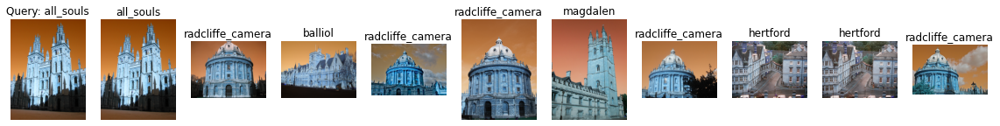

Label: all_souls
Average Precision for query 0:  0.19170340715177803
Precision@k for query 0:  0.1




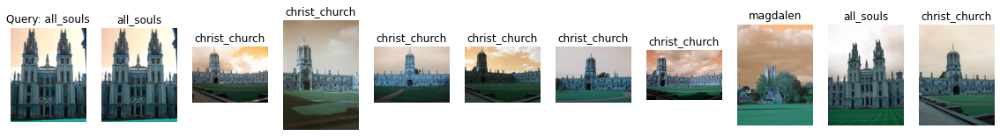

Label: all_souls
Average Precision for query 1:  0.1327546791905166
Precision@k for query 1:  0.2




KeyboardInterrupt: 

In [68]:
k = 10
view_option = 2

AP, AR, precisionsatk = image_retrieval_k(good_ok_data_pixels, query_pixels, good_ok_data_names, query_names, good_ok_data_colour_images, query_colour_images, k, view_option)

In [44]:
mAP = np.average(AP)
print(mAP)

0.215413081645098


## Solving BoW

In [68]:
def SIFT(images):
    sift = cv2.SIFT_create()
    
    keypoints_per_image = []
    descriptor_per_image = []
    
    count = 0
    for image in images:
        keypoints, descriptor = sift.detectAndCompute(image, None)

        keypoints_per_image.append(keypoints)
        descriptor_per_image.append(descriptor)
        
        count += 1 
        clear_output(wait=True)
        print("Percentage Completed: {}%".format(round((count/len(images))*100), 2))
    
    return keypoints_per_image, descriptor_per_image

def stack_descriptors(descriptors):
    stack = []
    
    for desc in descriptors:
        tmp = np.array(desc)
        if tmp.shape:
            stack.append(tmp)
            
    all_descriptors = np.vstack(i for i in stack)
    
    return all_descriptors

def cluster(data, n_clusters=100, cluster_type="minibatch"):
    start = time.time()
    
    if cluster_type == "minibatch":
        cluster = MiniBatchKMeans(n_clusters=n_clusters)
        y_cluster = cluster.fit(data)
    elif cluster_type == "kmeans":
        cluster = KMeans(n_clusters=n_clusters)
        y_cluster = cluster.fit(data)
    else:
        print("Unknown cluster_type! Try: 'minibatch' or 'kmeans'")
        
    end = time.time()
    print("Time Elapsed: {} min".format(round((end - start)/60, 2)))
    return y_cluster

def solve_BoW(descriptors, y_cluster, n_clusters):
    previous = 0
    count = 0
    image_words = []
    for image_number in range(len(descriptors)):
        if descriptors[image_number] is not None:
            tmp = []
            for kp in descriptors[image_number]:
                cluster = y_cluster.predict(np.array([kp]))
                tmp.append(cluster[0])
            image_words.append(tmp)
            
            count += 1
            clear_output(wait=True)
            print("(1/2) Percentage Completed: {}%".format(round((count/len(descriptors))*100), 2))
        else:
            # If image has no desciptors, append 0 words to it
            image_words.append([0])

    count = 0
    image_histograms = []
    for image in range(len(image_words)):
        hist = np.zeros(n_clusters)
        for words in image_words[image]:
            hist[words-1] = hist[words-1]+1
        image_histograms.append(hist)
        
        count += 1
        clear_output(wait=True)
        print("(2/2) Percentage Completed: {}%".format(round((count/len(image_words))*100), 2))
    
    return image_histograms

## Query Descriptors

In [9]:
query_keypoints_per_image, query_descriptor_per_image = SIFT(query_gray_images)

Percentage Completed: 100%


<ipython-input-8-8f56397ec977>:28: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  all_descriptors = np.vstack(i for i in stack)


## Good_ok data Descriptors

In [10]:
good_ok_keypoints_per_image, good_ok_descriptor_per_image = SIFT(good_ok_data_gray_images)
good_ok_stacked_desriptors = stack_descriptors(good_ok_descriptor_per_image)

Percentage Completed: 100%


<ipython-input-8-8f56397ec977>:28: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  all_descriptors = np.vstack(i for i in stack)


## Parameters:

In [83]:
n_clusters = 100
cluster_type = "kmeans"

## BoW computation

In [89]:
good_ok_y_clusters = cluster(good_ok_stacked_desriptors, n_clusters, cluster_type)

Time Elapsed: 55.35 min


In [90]:
good_ok_data_BoW = solve_BoW(good_ok_descriptor_per_image, good_ok_y_clusters, n_clusters)
query_BoW  = solve_BoW(query_descriptor_per_image, good_ok_y_clusters, n_clusters)

(2/2) Percentage Completed: 100%


In [91]:
from sklearn.feature_extraction.text import TfidfTransformer
transformer = TfidfTransformer(smooth_idf=False)

query_tfidf = transformer.fit_transform(query_BoW).toarray()
good_ok_data_tfidf= transformer.fit_transform(good_ok_data_BoW).toarray()

## Computing Metrics for BoW

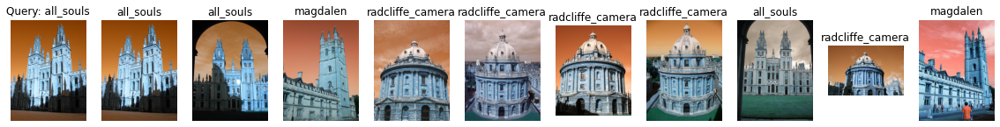

Label: all_souls
Average Precision for query 0:  0.3137988987057871
Precision@k for query 0:  0.3




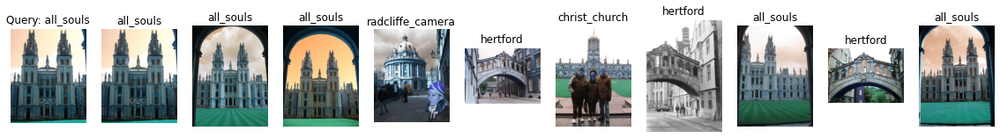

Label: all_souls
Average Precision for query 1:  0.26896978278981615
Precision@k for query 1:  0.5




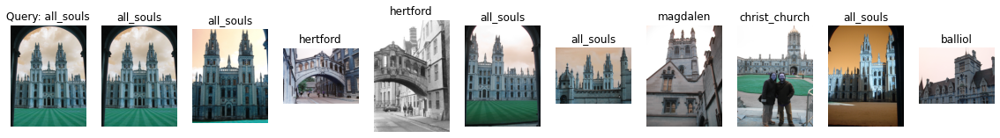

Label: all_souls
Average Precision for query 2:  0.2931301160464315
Precision@k for query 2:  0.5




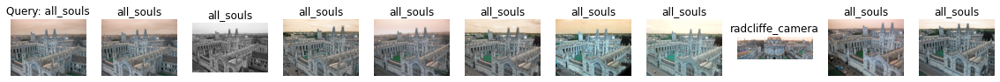

Label: all_souls
Average Precision for query 3:  0.5947159088112508
Precision@k for query 3:  0.9




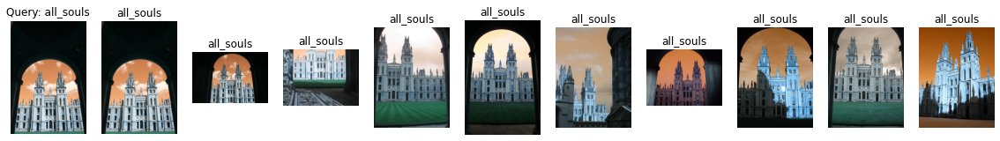

Label: all_souls
Average Precision for query 4:  0.48274645222910123
Precision@k for query 4:  1.0




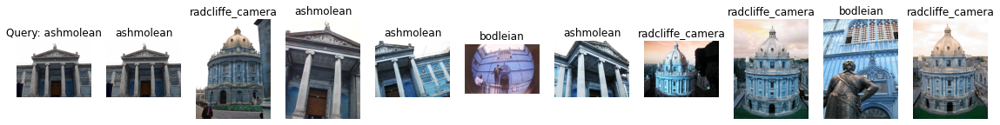

Label: ashmolean
Average Precision for query 5:  0.20944481888615837
Precision@k for query 5:  0.4




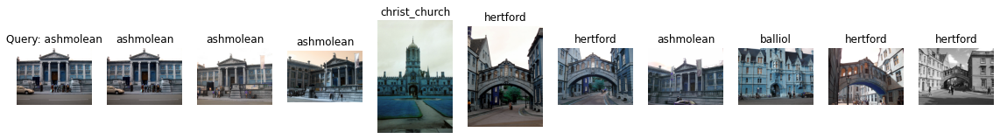

Label: ashmolean
Average Precision for query 6:  0.1970264976616862
Precision@k for query 6:  0.4




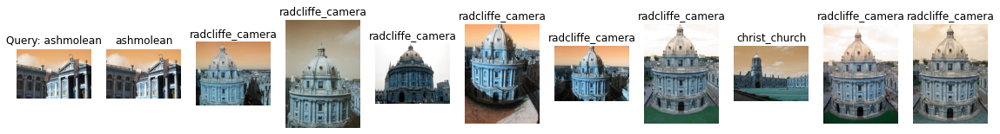

Label: ashmolean
Average Precision for query 7:  0.06951731073506076
Precision@k for query 7:  0.1




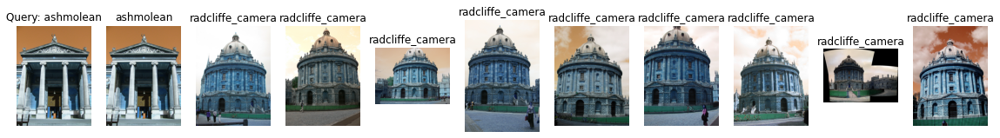

Label: ashmolean
Average Precision for query 8:  0.08934889992558132
Precision@k for query 8:  0.1




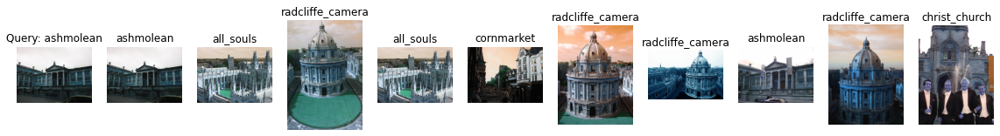

Label: ashmolean
Average Precision for query 9:  0.12777297880927688
Precision@k for query 9:  0.2




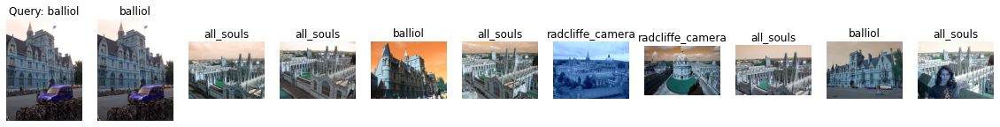

Label: balliol
Average Precision for query 10:  0.22444822968392356
Precision@k for query 10:  0.3




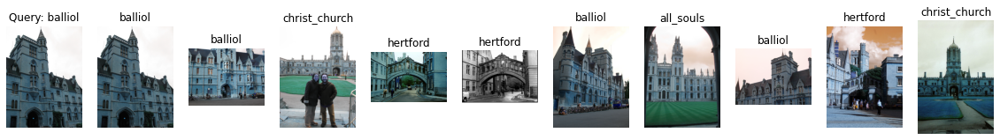

Label: balliol
Average Precision for query 11:  0.35213724480672476
Precision@k for query 11:  0.4




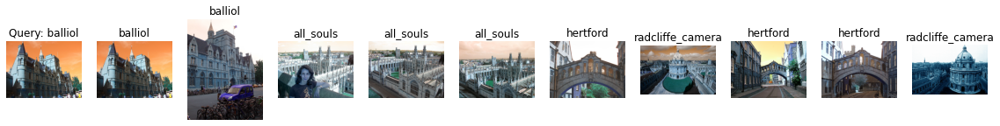

Label: balliol
Average Precision for query 12:  0.24288842582804882
Precision@k for query 12:  0.2




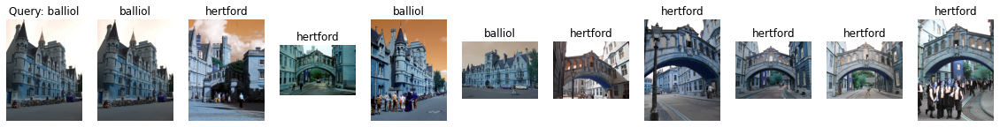

Label: balliol
Average Precision for query 13:  0.2616952925967066
Precision@k for query 13:  0.3




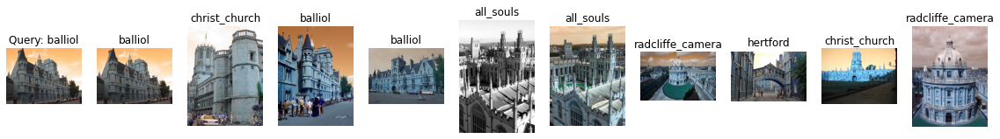

Label: balliol
Average Precision for query 14:  0.259879304989367
Precision@k for query 14:  0.3




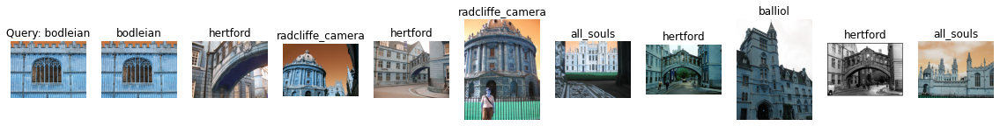

Label: bodleian
Average Precision for query 15:  0.15233166904490172
Precision@k for query 15:  0.1




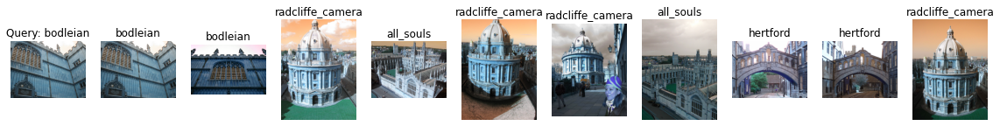

Label: bodleian
Average Precision for query 16:  0.11739838929638485
Precision@k for query 16:  0.2




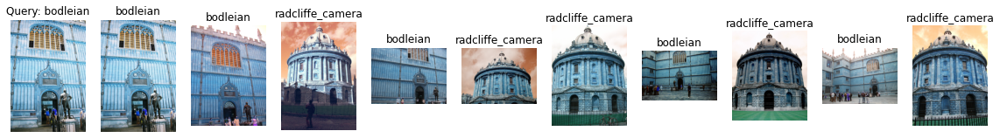

Label: bodleian
Average Precision for query 17:  0.26119537761225575
Precision@k for query 17:  0.5




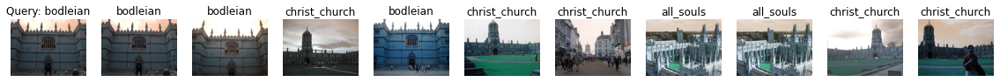

Label: bodleian
Average Precision for query 18:  0.15829115803608415
Precision@k for query 18:  0.3




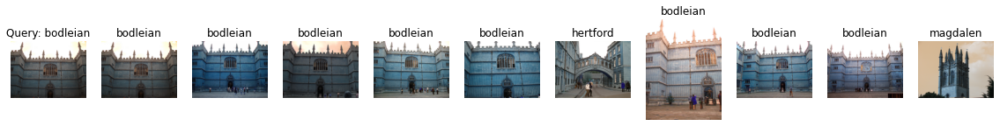

Label: bodleian
Average Precision for query 19:  0.4377036404375567
Precision@k for query 19:  0.8




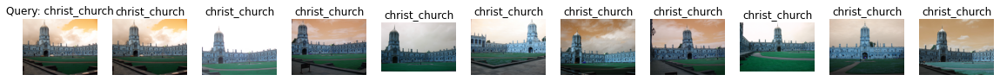

Label: christ_church
Average Precision for query 20:  0.43116283414857126
Precision@k for query 20:  1.0




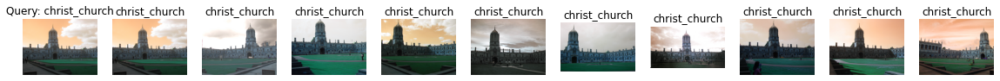

Label: christ_church
Average Precision for query 21:  0.6311108084472148
Precision@k for query 21:  1.0




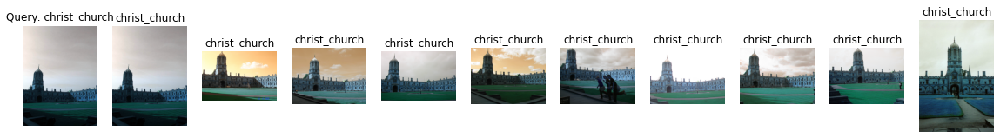

Label: christ_church
Average Precision for query 22:  0.4897148385338412
Precision@k for query 22:  1.0




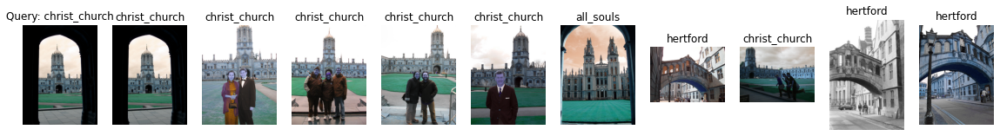

Label: christ_church
Average Precision for query 23:  0.3317404996718826
Precision@k for query 23:  0.6




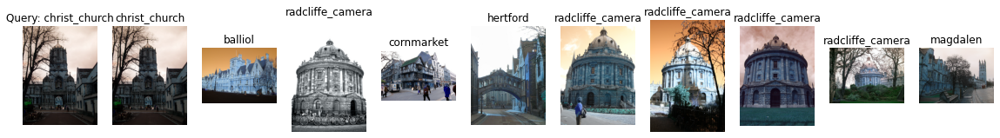

Label: christ_church
Average Precision for query 24:  0.11041446445058853
Precision@k for query 24:  0.1




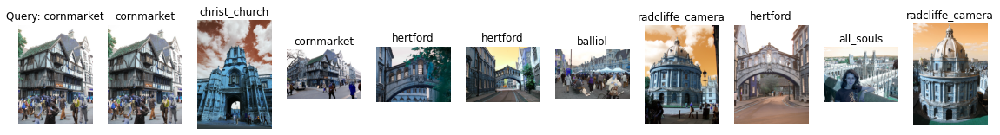

Label: cornmarket
Average Precision for query 25:  0.22850096430314323
Precision@k for query 25:  0.2




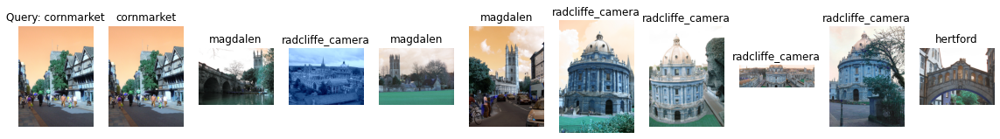

Label: cornmarket
Average Precision for query 26:  0.13446012779427002
Precision@k for query 26:  0.1




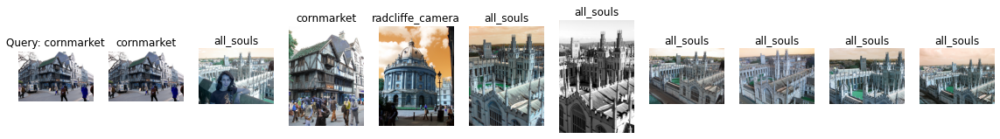

Label: cornmarket
Average Precision for query 27:  0.22888306436710085
Precision@k for query 27:  0.2




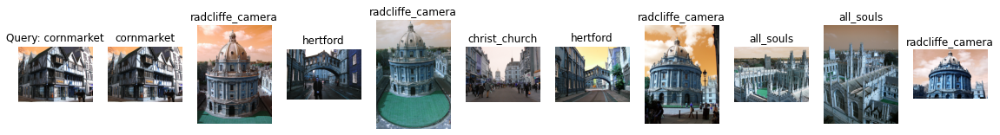

Label: cornmarket
Average Precision for query 28:  0.17459015444830409
Precision@k for query 28:  0.1




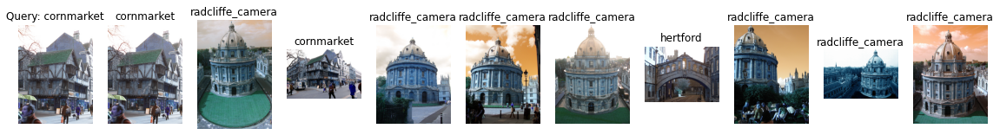

Label: cornmarket
Average Precision for query 29:  0.23167923594512946
Precision@k for query 29:  0.2




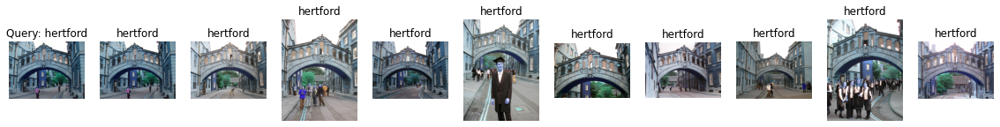

Label: hertford
Average Precision for query 30:  0.6660994316412044
Precision@k for query 30:  1.0




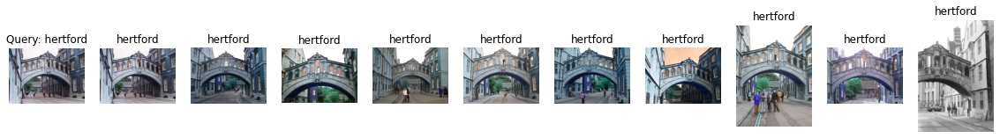

Label: hertford
Average Precision for query 31:  0.6478907968332456
Precision@k for query 31:  1.0




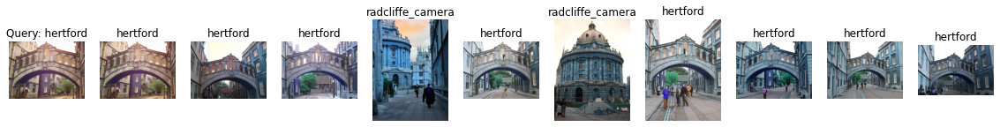

Label: hertford
Average Precision for query 32:  0.4495184008852982
Precision@k for query 32:  0.8




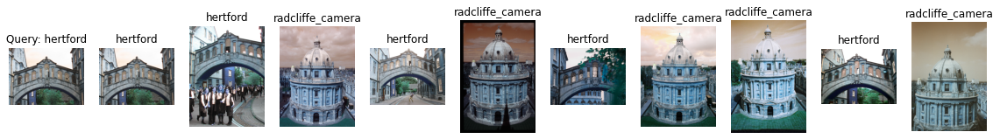

Label: hertford
Average Precision for query 33:  0.34149277716850224
Precision@k for query 33:  0.5




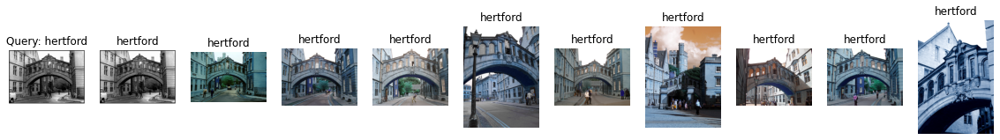

Label: hertford
Average Precision for query 34:  0.6903454686733371
Precision@k for query 34:  1.0




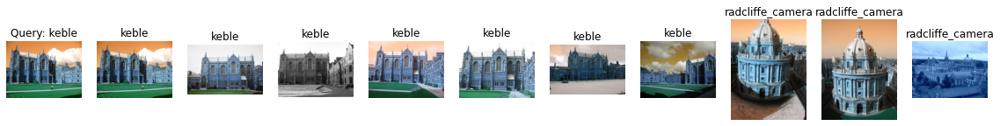

Label: keble
Average Precision for query 35:  1.0
Precision@k for query 35:  0.7




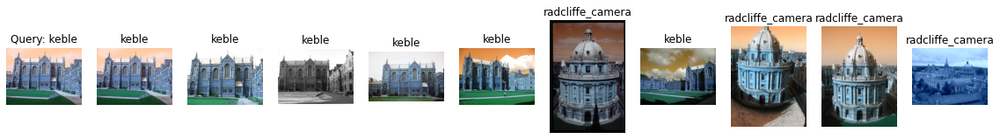

Label: keble
Average Precision for query 36:  0.9276437847866419
Precision@k for query 36:  0.6




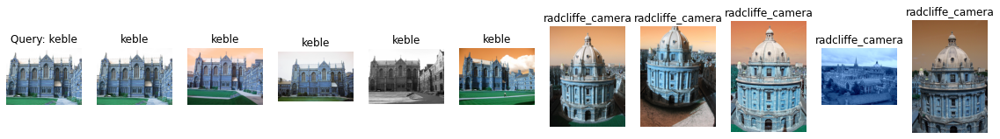

Label: keble
Average Precision for query 37:  0.8571428571428571
Precision@k for query 37:  0.5




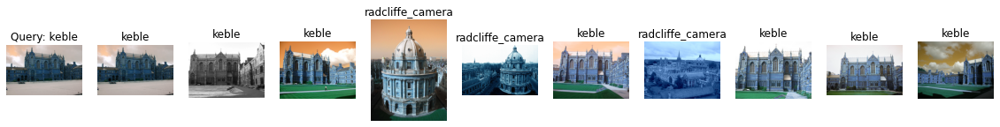

Label: keble
Average Precision for query 38:  0.8083333333333333
Precision@k for query 38:  0.7




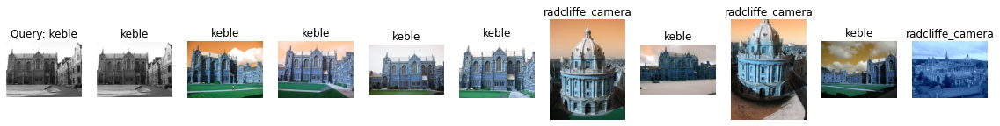

Label: keble
Average Precision for query 39:  0.9478458049886621
Precision@k for query 39:  0.7




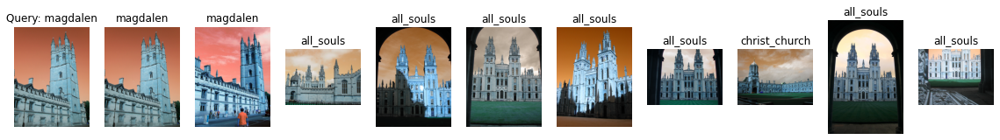

Label: magdalen
Average Precision for query 40:  0.09552093708466183
Precision@k for query 40:  0.2




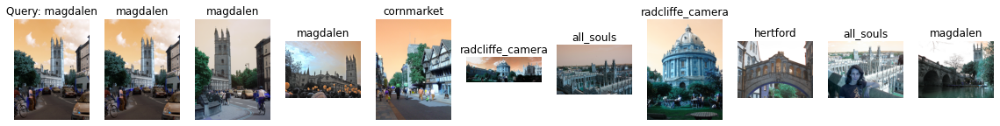

Label: magdalen
Average Precision for query 41:  0.25224662147008287
Precision@k for query 41:  0.4




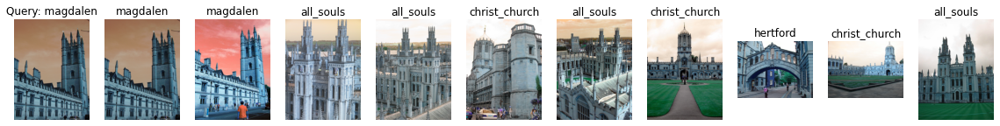

Label: magdalen
Average Precision for query 42:  0.09579569261370169
Precision@k for query 42:  0.2




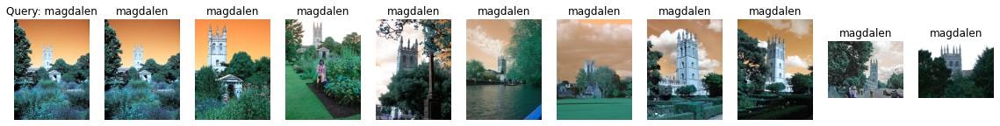

Label: magdalen
Average Precision for query 43:  0.5935664778742683
Precision@k for query 43:  1.0




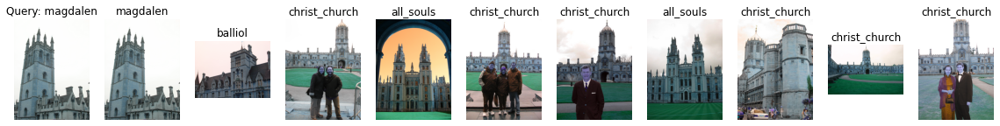

Label: magdalen
Average Precision for query 44:  0.09495796874165997
Precision@k for query 44:  0.1




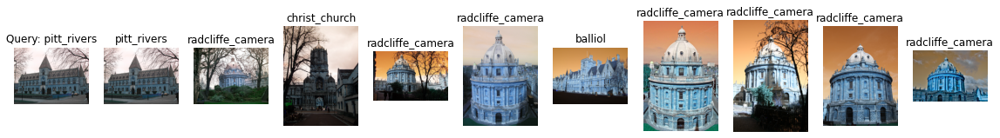

Label: pitt_rivers
Average Precision for query 45:  0.1843392530174722
Precision@k for query 45:  0.1




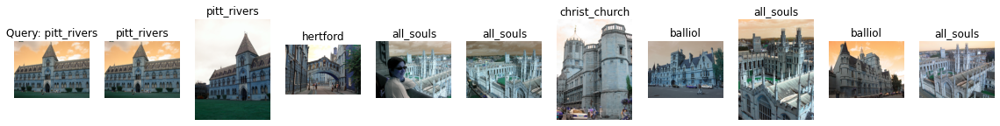

Label: pitt_rivers
Average Precision for query 46:  0.3463134983636123
Precision@k for query 46:  0.2




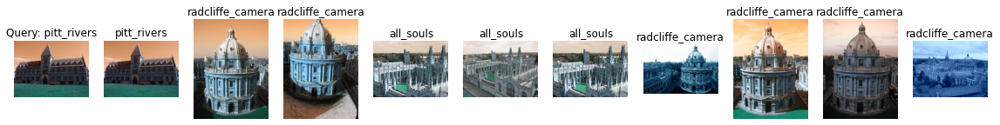

Label: pitt_rivers
Average Precision for query 47:  0.17699558000946236
Precision@k for query 47:  0.1




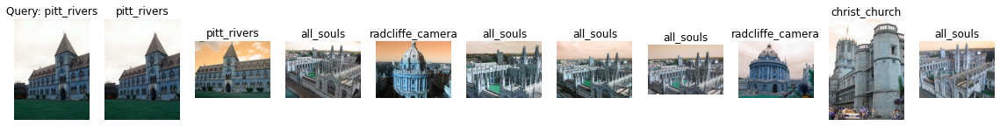

Label: pitt_rivers
Average Precision for query 48:  0.34300445328361717
Precision@k for query 48:  0.2




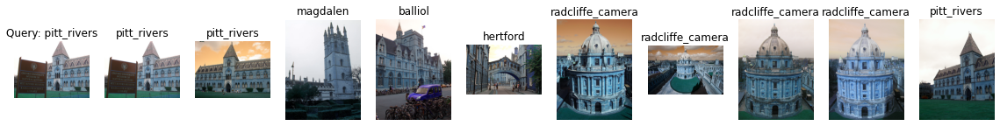

Label: pitt_rivers
Average Precision for query 49:  0.39612133371647457
Precision@k for query 49:  0.3




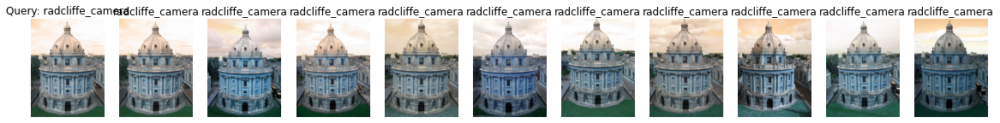

Label: radcliffe_camera
Average Precision for query 50:  0.6137797436662344
Precision@k for query 50:  1.0




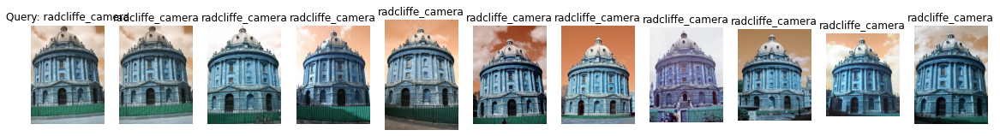

Label: radcliffe_camera
Average Precision for query 51:  0.7237409283911835
Precision@k for query 51:  1.0




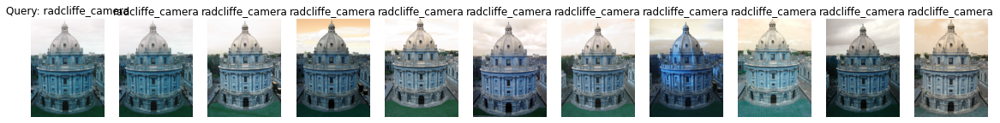

Label: radcliffe_camera
Average Precision for query 52:  0.6987974616218395
Precision@k for query 52:  1.0




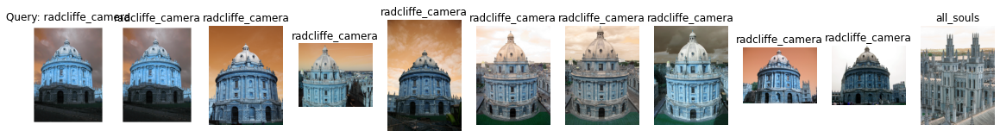

Label: radcliffe_camera
Average Precision for query 53:  0.6141923426304295
Precision@k for query 53:  0.9




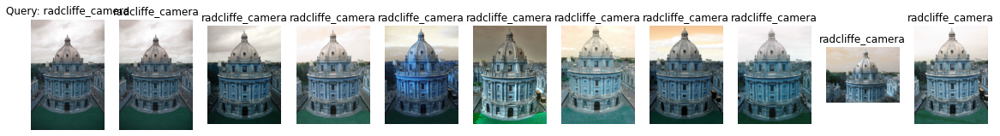

Label: radcliffe_camera
Average Precision for query 54:  0.6639061816773851
Precision@k for query 54:  1.0


0.38793251852104216


In [93]:
# QUERY + GOOD + OK
k = 10
view_option = 2

AP, AR, precisionsatk = image_retrieval_k(good_ok_data_tfidf, query_tfidf, good_ok_data_names, query_names, good_ok_data_colour_images, query_colour_images, k, view_option)

mAP = np.average(AP)
print(mAP)

save_data_to_csv(precisionsatk, AP, k, "Oxford5k_gt_BoW_{}_{}".format(n_clusters, cluster_type))

Look into: https://medium.com/@aybukeyalcinerr/bag-of-visual-words-bovw-db9500331b2f \
Look into: https://scikit-learn.org/stable/modules/feature_extraction.html (Tf–idf term weighting)

Pixel Values:\
    mAP = 0.215

Mini-Batch:\
BoW for 100 words:\
    mAP = 0.148, 0.146(normalized desc)

BoW for 1000 words:\
    mAP = 0.147, 0.148(normalized desc), 0.146(normalized BoW)
    
BoW for 10,000 words:\
    mAP = 

Non-overfitting mAP values (not clustering the test descriptors):\
kmeans:\
100 words: mAP=0.3227(normal), mAP=0.2711(scaled BoW), mAP=0.2711(scaled descriptors before cluster), mAP=0.3879(tf-idf)